## **9. Detecting Faces in Group Photos**

*  Use the face detection code to identify and highlight faces in group pictures.

In [ ]:
!git clone https://github.com/MEXECardenas/9-16
%cd 9-16
!pip install face_recognition
%cd face_recognition
from IPython.display import clear_output
clear_output()

In [ ]:
import face_recognition
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

# Step 1: Create encoding profiles for known faces
face_1 = face_recognition.load_image_file("Pictures/momo.jpg")
face_1_encoding = face_recognition.face_encodings(face_1)[0]

face_2 = face_recognition.load_image_file("Pictures/sana.jpg")
face_2_encoding = face_recognition.face_encodings(face_2)[0]

face_3 = face_recognition.load_image_file("Pictures/mina.jpg")
face_3_encoding = face_recognition.face_encodings(face_3)[0]

# Store known encodings and corresponding names
known_face_encodings = [face_1_encoding, face_2_encoding, face_3_encoding]
known_face_names = ["Momo", "Sana", "Mina"]

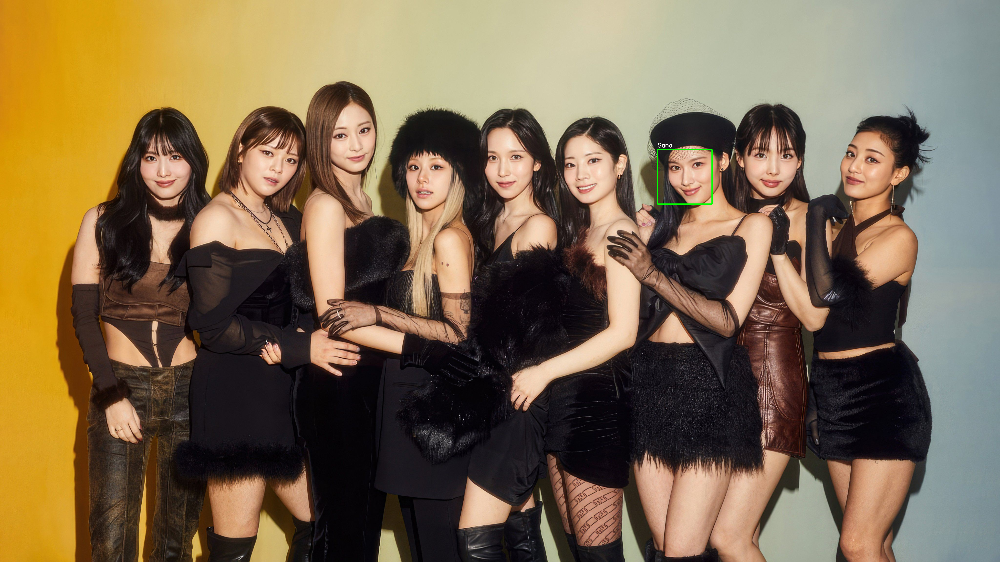

In [ ]:
# Step 2: Load the image
file_name = "Pictures/twice1.jpg"
unknown_image = face_recognition.load_image_file(file_name)
unknown_image_to_draw = cv2.imread(file_name)

# Step 3: Detect all faces
face_locations = face_recognition.face_locations(unknown_image)
face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

if face_locations:
    best_match_name = "Unknown"
    best_match_distance = float("inf")
    best_face_location = None

    # Compare all detected faces to find the best match
    for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
        face_distances = face_recognition.face_distance(known_face_encodings, face_encoding)
        match_index = np.argmin(face_distances)

        if face_distances[match_index] < best_match_distance:  # Find the closest match
            best_match_distance = face_distances[match_index]
            best_match_name = known_face_names[match_index]
            best_face_location = (top, right, bottom, left)

    if best_face_location:
        # Draw rectangle around the best matching face
        top, right, bottom, left = best_face_location
        cv2.rectangle(unknown_image_to_draw, (left, top), (right, bottom), (0, 255, 0), 3)
        cv2.putText(unknown_image_to_draw, best_match_name, (left, top - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

# Step 4: Display the resulting image
cv2_imshow(unknown_image_to_draw)

##**10. Outlining Shapes with Contours**
*   Apply the contour detection code to outline and highlight shapes in simple object images.

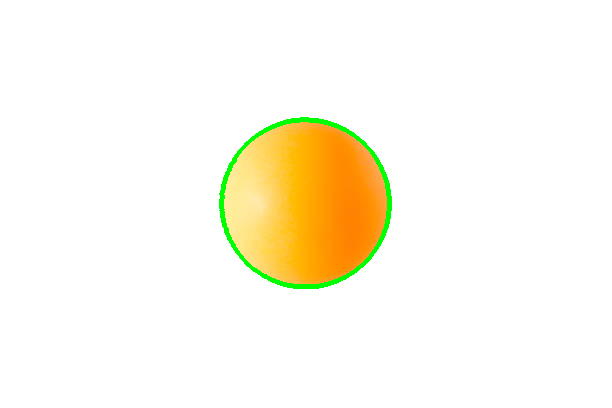

In [ ]:
# Load the image
img = cv2.imread("Pictures/pingpong.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Enhance contrast
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced_gray = clahe.apply(gray)

# Apply Gaussian blur
blurred = cv2.GaussianBlur(enhanced_gray, (5, 5), 0)

# Threshold the image
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
)

# Find contours
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Variables to store the best match
best_contour = None
max_area = 0

# Analyze contours
for cnt in contours:
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    if perimeter == 0:
        continue  # Avoid division by zero

    circularity = 4 * np.pi * (area / (perimeter ** 2))
    if 0.7 <= circularity <= 1.2:  # Circular shape criteria
        # Keep only the largest contour
        if area > max_area:
            max_area = area
            best_contour = cnt

# Draw the largest circular contour
if best_contour is not None:
    x, y, w, h = cv2.boundingRect(best_contour)
    cv2.drawContours(img, [best_contour], 0, (0, 255, 0), 3)
    cv2.putText(img, "Ping Pong Ball", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

# Hough Circle Transform
circles = cv2.HoughCircles(
    blurred,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=20,
    param1=50,
    param2=35,  # Higher threshold to reduce false positives
    minRadius=10,
    maxRadius=50,
)

# Filter redundant circles
if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        # Draw only if no overlapping contour or redundant detection
        if best_contour is None or cv2.pointPolygonTest(best_contour, (i[0], i[1]), False) < 0:
            cv2.circle(img, (i[0], i[1]), i[2], (0, 255, 0), 3)
            cv2.circle(img, (i[0], i[1]), 2, (0, 0, 255), 3)

# Display the result
cv2_imshow(img)